# Dog Vision

## Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

## Features
* We're dealing with images (unstructured data), we will use deep learning/transfer learning.
* There are 120 breeds of dogs, so 120 classes
* There are 10,000+ images in training set, images have labels
* There are 10,000+ images in test set, images have no labels

### Get our workspace ready
* import Tensorflow 2.x
* import Tensorflow Hub
* Make sure we're using a GPU

In [ ]:
# Unzip the uploaded data into google drive
# !unzip "drive/MyDrive/Colab Data/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Colab Data/Dog Vision"

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.18.0
TF Hub version: 0.16.1
GPU available (YESSSS!!!!!)


## Getting our data ready (turning into Tensors)

With all machine learning models, our data must be in numerical formats

In [6]:
import pandas as pd
import numpy as np

labels_csv = pd.read_csv("drive/MyDrive/Colab Data/Dog Vision/labels.csv");
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


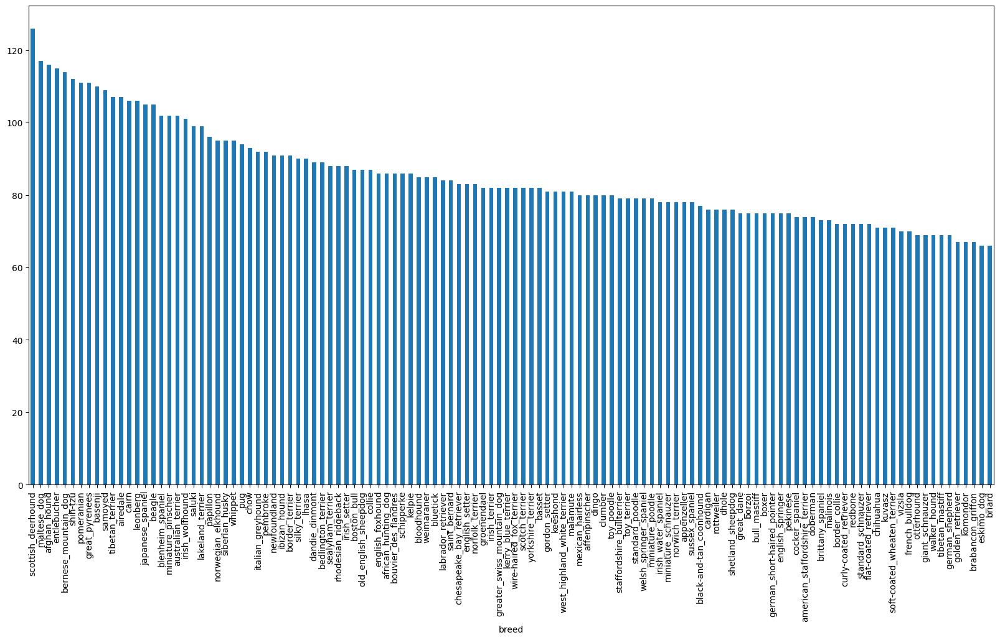

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

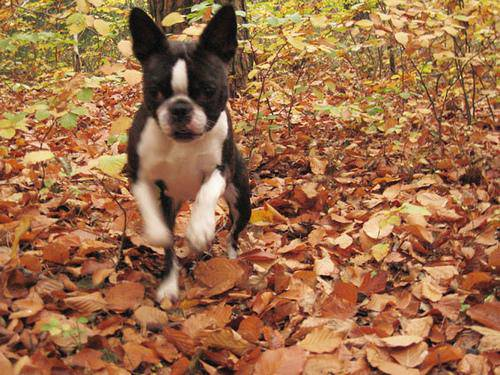

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/Colab Data/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Get images and their labels

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [7]:
filenames = ["drive/MyDrive/Colab Data/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

filenames[:10]

['drive/MyDrive/Colab Data/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Colab Data/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of data!")
else:
  print("Filenames do not match actual amount of data :(")

Filenames match actual amount of data!


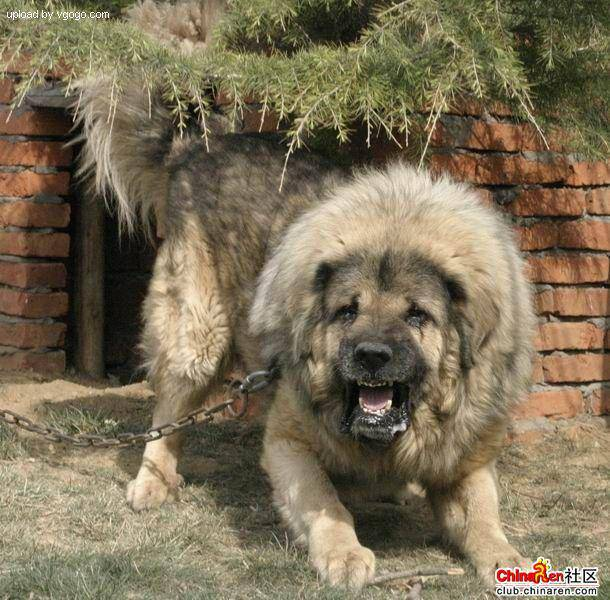

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

We have our training image filepaths, let's prepare our labels

In [8]:
labels = []
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filename")
else:
  print("Number of labels do not match number of filenames, check data directories")

Number of labels matches number of filename


In [9]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # index where labels occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/Colab Data/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Data/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

Creating our own validation set, as kaggle doesn't have it

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We will start with experimenting 1000 images and increasing as we need

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's spit our data into traing and validation sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
# a Gaze
X_train[:5], y_train[:2]

(['drive/MyDrive/Colab Data/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Colab Data/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Colab Data/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Colab Data/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Colab Data/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
   

Preprocessing images (turning images into Tensors)
1. Take image filepatha s input
2. Use TensorFlow to read teh file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of  (224, 224)
6. Return the modified image

Before we do, let's see what importing an image looks like

In [ ]:
# Convert image to Numpy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape # gives us color channel

(257, 350, 3)

In [ ]:
image.max(),image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2] # can run on GPU now, turns image into tensor

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [23]:
# Define image size
IMG_SIZE = 128

# Create a function for pre processing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 color channels RBG
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-225 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (244,244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

because all 10,000+ images might not fit into memory, so 32 (batch size) at a time

we need our data in the form of Tensor tuples `(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(128, 128, 3), dtype=float32, numpy=
 array([[[0.27929032, 0.4751063 , 0.2795834 ],
         [0.27585176, 0.46525738, 0.26177704],
         [0.3406097 , 0.52753276, 0.30271655],
         ...,
         [0.2751685 , 0.49869794, 0.29869792],
         [0.28818935, 0.51209253, 0.31603253],
         [0.29382864, 0.52127963, 0.33304432]],
 
        [[0.21575989, 0.41348663, 0.2655423 ],
         [0.29273564, 0.48136288, 0.32789788],
         [0.3189494 , 0.505239  , 0.33296594],
         ...,
         [0.25343138, 0.47303924, 0.28489584],
         [0.2582874 , 0.4802207 , 0.2991575 ],
         [0.27520525, 0.49873468, 0.32627755]],
 
        [[0.1963847 , 0.39246315, 0.28385404],
         [0.2122244 , 0.4047182 , 0.29629302],
         [0.22513789, 0.41602883, 0.29334742],
         ...,
         [0.22732845, 0.44489893, 0.27724636],
         [0.23500296, 0.45068926, 0.2900581 ],
         [0.25955886, 0.47524515, 0.32041976]],
 
        ...,
 
        [[0.13864364, 0.17785932

Now we've got a way to turn our data into tuples of Tensors `(image, label)`.
Now a function to turn all our daya (`X` & `y`) into batches

In [21]:
import tensorflow as tf
import tensorflow_hub as hub
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE,
                        valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we dont have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor funtion is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  """
  Displays 25 images from a list and their labels in a 5x5 grid.
  """
  # Setuo the figure
  plt.figure(figsize=(10,10))
  # Loop through 25
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.axis("off")
    plt.title(unique_breeds[labels[i].argmax()])

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

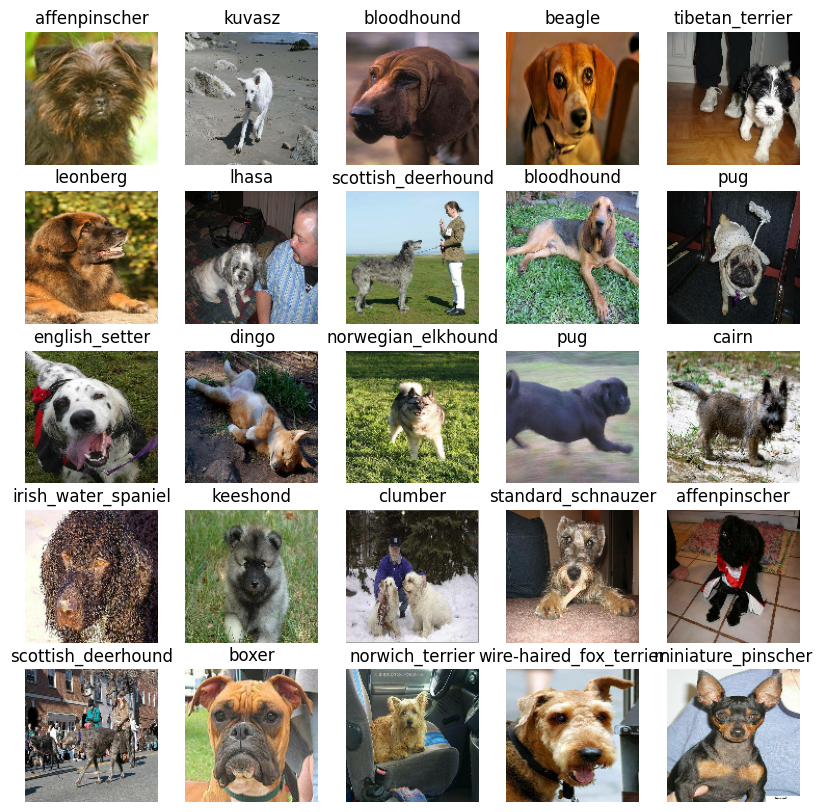

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator()) # unbatches it
show_25_images(train_images, train_labels)

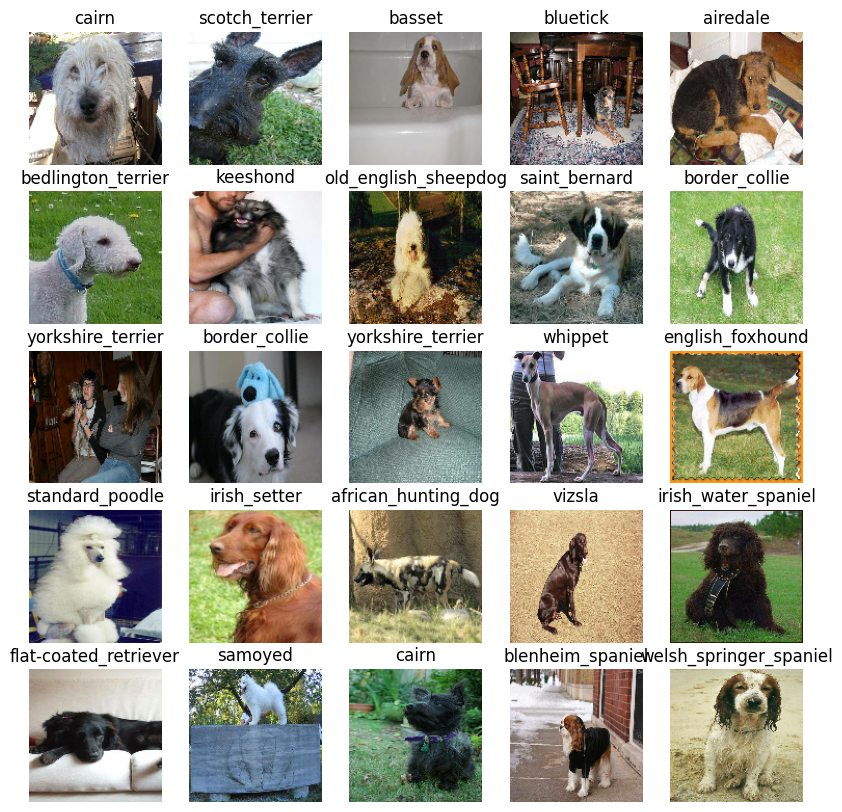

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels);

## Building a model

We will neeed to define:
* The `input` shape (our images shape as Tensors) to our model.
* The output shape (image labels as Tensors) of our model.
* The URL of the model we want to use.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2"

Let's put all together into a Keras deep learning model!

A function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion
* Compiles the model
* Build the model
* Returns the model

In [28]:
# Custom wrapper layer
class HubLayer(tf.keras.layers.Layer):
    def __init__(self, model_url, trainable=False, **kwargs):
        super().__init__(**kwargs)
        self.model_url = model_url
        self.feature_extractor = hub.KerasLayer(model_url, trainable=trainable)

    def call(self, inputs):
        return self.feature_extractor(inputs)[:, :-1]  # ✅ Removes extra feature

    def get_config(self):
        config = super().get_config()
        config.update({"model_url": self.model_url})
        return config


In [ ]:
from tensorflow.keras import layers

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", model_url)

    model = tf.keras.Sequential([
        layers.InputLayer(input_shape=input_shape[1:]),
        HubLayer(model_url, trainable=False),  # ✅ Uses the safe HubLayer
        layers.Dense(output_shape, activation="softmax")
    ])

    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model

Each of the 120 output neurons (classes) is connected to all 1000 input features.

📌 How does it work?

Each feature is multiplied by a weight.
Then, a bias is added.
This happens for every class (120 neurons).
Formula for each class:
```
Class Output=(W1 × Feature1) + (W2 × Feature2) + ... + (W1000 × Feature1000) + b
```
b → Bias term
This is a simple equation that helps the model "decide" the class!

In [ ]:
model= create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ hub_layer (HubLayer)                 │ (None, 1000)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         120,120 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,120 (469.22 KB)

 Trainable params: 120,120 (469.22 KB)

 Non-trainable params: 0 (0.00 B)

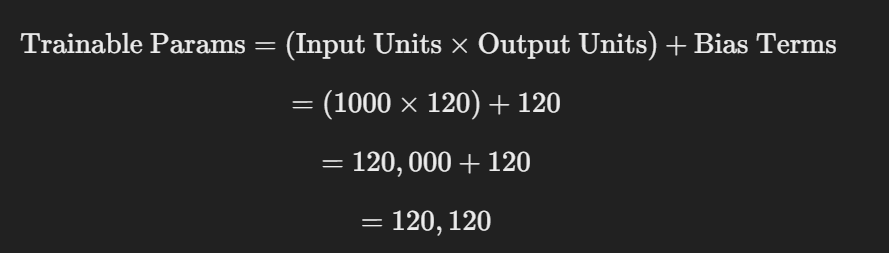

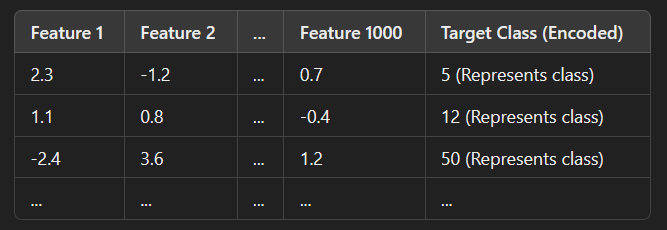

Each feature is connected to every class neuron, meaning there are 1000 × 120 connections (weights).
Each class neuron also has its own bias, so we add 120 biases.

## Creating callbacks

Helper functions a model can use during training to do such things
* Save it's progress
* Check it's progress
* Stop training early if a model stops improving

We will create two callbacks
1. for TensorBoard which helps tarck our modes progress and,
2. another for early stopping which prevents our model from training for too long.

### TensorBoard Callback
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with the `%tensorboard` magic function.

In [ ]:
# Load extension
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/Colab Data/Dog Vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSSS!!!!!)


In [ ]:
def train_model():
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 261s 10s/step - accuracy: 0.0247 - loss: 6.1419 - val_accuracy: 0.0700 - val_loss: 4.5610
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - accuracy: 0.3673 - loss: 2.6741 - val_accuracy: 0.1950 - val_loss: 3.7002
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - accuracy: 0.8089 - loss: 1.0602 - val_accuracy: 0.2400 - val_loss: 3.5181
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 216ms/step - accuracy: 0.9394 - loss: 0.5325 - val_accuracy: 0.2450 - val_loss: 3.5280
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - accuracy: 0.9848 - loss: 0.2740 - val_accuracy: 0.2500 - val_loss: 3.4961
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - accuracy: 1.0000 - loss: 0.1643 - val_accuracy: 0.2450 - val_loss: 3.5088
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - accuracy: 1.0000 - loss: 0.1214 - val_accuracy: 0.2300 - val_l

### Model is Overfitting

Overfitting to begin with is a good thing, means our model is learning

### Checking TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access teh logs directory we created ealrier and visualize its contents

In [ ]:
%tensorboard --logdir drive/MyDrive/Colab\ Data/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 580ms/step


array([[8.6421431e-05, 1.4785401e-03, 6.8090274e-05, ..., 3.2975640e-05,
        3.5359687e-03, 1.5109015e-03],
       [3.4802077e-05, 2.6701118e-05, 4.6976313e-02, ..., 3.3850309e-05,
        1.2882870e-03, 3.4651707e-04],
       [1.3757229e-06, 2.1232625e-03, 9.3443180e-07, ..., 9.8192319e-03,
        4.1165713e-05, 2.5676496e-03],
       ...,
       [4.2916658e-05, 4.9805926e-04, 5.1501999e-04, ..., 3.4736247e-05,
        4.6030426e-04, 8.0719730e-03],
       [2.7892960e-04, 6.0959597e-04, 1.5775184e-05, ..., 1.2962885e-04,
        5.8280184e-06, 4.5046434e-04],
       [7.6820597e-06, 1.7266718e-04, 2.2990990e-04, ..., 3.0057080e-04,
        1.8912986e-03, 2.3750605e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
(len(y_val), len(unique_breeds))

(200, 120)

In [ ]:
# prediction
index = 42
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

Max value (probability of prediction): 0.3217550218105316
Sum: 0.9999998807907104
Max index: 39
Predicted label: english_foxhound


Having the above functionality is great, but we want to be able to do it at scale, and also see the precitions

**Note** Prediction probabilities are also knows as confidence lavels

In [34]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# get a predicted label based on an array of prediction probabilities
# pred_label = get_pred_label(predictions[81])
# pred_label

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Since our validation data is still in a baych dataset, we'll have to to unbatch it, and then compare

In [ ]:
images_ = []
labels_ = []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.25828475, 0.36198825, 0.24389817],
         [0.39360544, 0.3418826 , 0.30183154],
         [0.8296768 , 0.7504122 , 0.74760556],
         ...,
         [0.8228947 , 0.8611053 , 0.8719636 ],
         [0.76902866, 0.8160875 , 0.8079686 ],
         [0.8183106 , 0.82737565, 0.84341663]],
 
        [[0.30484715, 0.29425842, 0.2039199 ],
         [0.4352226 , 0.37971696, 0.31883615],
         [0.8593526 , 0.80739874, 0.77293175],
         ...,
         [0.85530514, 0.89059925, 0.917223  ],
         [0.80846506, 0.8516023 , 0.8737746 ],
         [0.7754192 , 0.8053707 , 0.84239584]],
 
        [[0.75496686, 0.6921665 , 0.66526437],
         [0.807427  , 0.804948  , 0.7710658 ],
         [0.9814564 , 0.9935267 , 0.971697  ],
         ...,
         [0.91192657, 0.94484705, 0.9793709 ],
         [0.8952671 , 0.9312506 , 0.98800606],
         [0.8093318 , 0.85525966, 0.91700304]],
 
        ...,
 
        [[0.45503026, 0.4585416 , 0.41656855],
         [0.5492001 , 0.5392863 , 0.49725

In [ ]:
get_pred_label(labels_[0]), get_pred_label(predictions[0])

('cairn', 'old_english_sheepdog')

In [ ]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  """
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify(val_data)

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob) * 100,
                                    true_label),
                                    color=color)

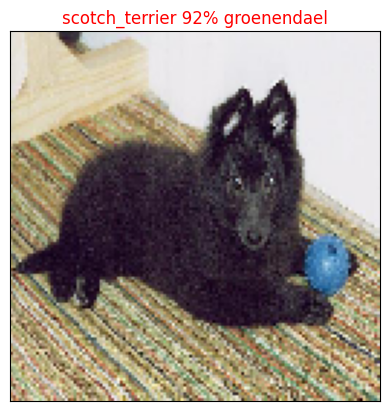

In [ ]:
plot_pred(predictions, val_labels, val_images, n=77)

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
def top_ten_predictions(prediction_probabilities, labels, n=1):
    """
    Plots the top 10 model's predicted class probabilities along with the truth label for sample n.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]
    pred_label = get_pred_label(pred_prob)

    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color="grey")
    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation="vertical")

    if np.isin(true_label, top_10_pred_labels):
      top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
      pass


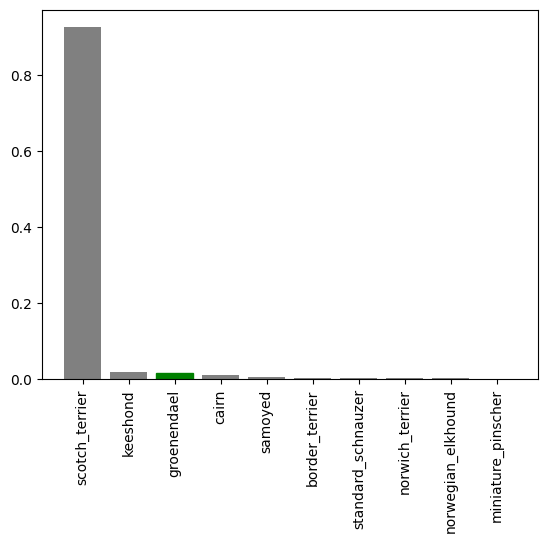

In [ ]:
top_ten_predictions(prediction_probabilities=predictions,
                    labels=val_labels,
                    n=77)

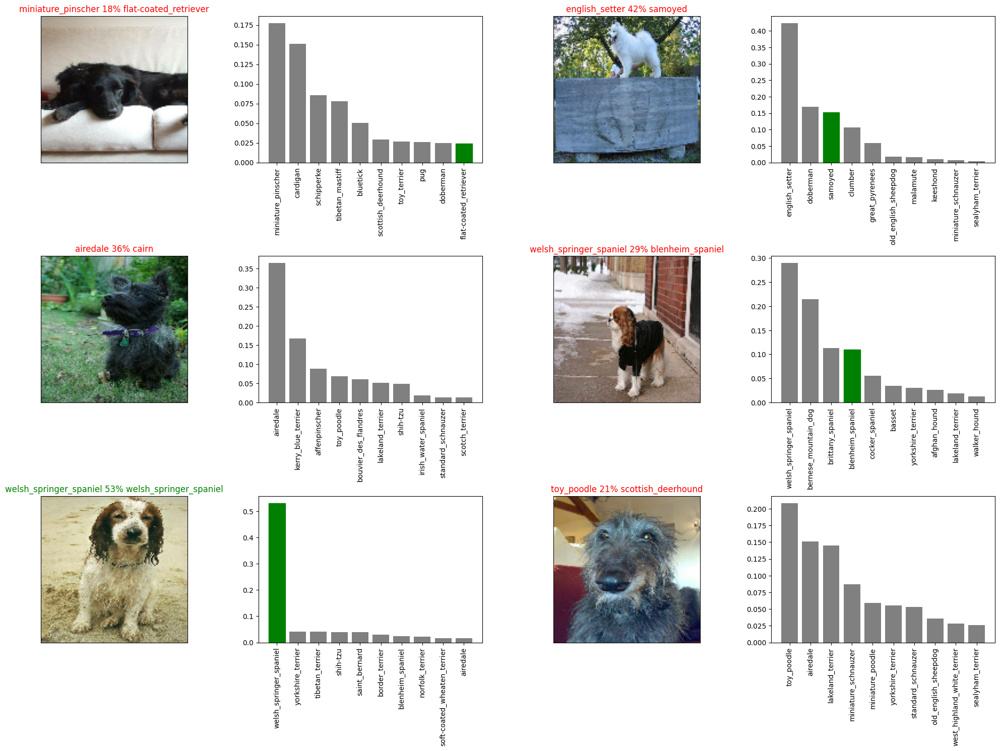

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows *num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  top_ten_predictions(prediction_probabilities=predictions,
                      labels=val_labels,
                      n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
def save_model(model, suffix=None):
  modeldir = os.path.join("/content/drive/MyDrive/Colab Data/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".keras"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [26]:
import tensorflow_hub as hub
import tensorflow as tf
import os
import datetime

def load_model(model_path):
    """ Loads a saved model and ensures TensorFlow Hub is available. """
    print(f"Loading saved model from: {model_path}")


    model = tf.keras.models.load_model(model_path,
                                       custom_objects={'HubLayer': HubLayer})

    return model

In [ ]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Data/Dog Vision/models/20250224-09401740390053-1000-images-mobilenetv2-Adam.keras...


'/content/drive/MyDrive/Colab Data/Dog Vision/models/20250224-09401740390053-1000-images-mobilenetv2-Adam.keras'

In [ ]:
saved_model_path = "/content/drive/MyDrive/Colab Data/Dog Vision/models/20250222-15281740238123-1000-images-mobilenetv2-Adam.keras";

## Loading our saved Model Now

In [ ]:
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - accuracy: 0.2606 - loss: 3.4468 


[3.540175437927246, 0.25]

In [ ]:
loaded_1000_image_model = load_model(saved_model_path)
loaded_1000_image_model.evaluate(val_data)

Loading saved model from: /content/drive/MyDrive/Colab Data/Dog Vision/models/20250222-15281740238123-1000-images-mobilenetv2-Adam.keras
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - accuracy: 0.1986 - loss: 3.5301


[3.5410735607147217, 0.20999999344348907]

In [ ]:
# Create a data batch with full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [ ]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(
                            monitor="accuracy",
                            patience=3)

In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - accuracy: 0.2176 - loss: 3.8020
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 74s 125ms/step - accuracy: 0.5670 - loss: 1.5789
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - accuracy: 0.6626 - loss: 1.1798
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - accuracy: 0.7175 - loss: 0.9701
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - accuracy: 0.7783 - loss: 0.7607
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - accuracy: 0.8267 - loss: 0.6147
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - accuracy: 0.8485 - loss: 0.5390
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - accuracy: 0.8829 - loss: 0.4426
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - accuracy: 0.9134 - loss: 0.3564
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - accuracy: 0.9250 - loss: 0.3171
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - accuracy: 0.9458 - loss: 0.2635
Epoch 12

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Data/Dog Vision/models/20250224-10111740391879-full-image-set-mobilenetv2-Adam.keras...


'/content/drive/MyDrive/Colab Data/Dog Vision/models/20250224-10111740391879-full-image-set-mobilenetv2-Adam.keras'

In [29]:
loaded_full_model = load_model("/content/drive/MyDrive/Colab Data/Dog Vision/models/20250224-10111740391879-full-image-set-mobilenetv2-Adam.keras");

Loading saved model from: /content/drive/MyDrive/Colab Data/Dog Vision/models/20250224-10111740391879-full-image-set-mobilenetv2-Adam.keras


## Making predictions on test dataset

Use `create_data_batches()` earlier whuck takes a list of filenames as input and convert them into Tensor batches

* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True`
* Make a predictions array by passing the test atches to the `predict()` on our model

In [12]:
test_path = "/content/drive/MyDrive/Colab Data/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Data/Dog Vision/test/e4fc0f20883984209dd64dff54dc89a0.jpg',
 '/content/drive/MyDrive/Colab Data/Dog Vision/test/de3fbd6fb5444fcf14390ac90545c2f1.jpg',
 '/content/drive/MyDrive/Colab Data/Dog Vision/test/e1dd78810048dc387573f2ec50e4bb16.jpg',
 '/content/drive/MyDrive/Colab Data/Dog Vision/test/e062ea256ada165dfe998fbc6529dff7.jpg',
 '/content/drive/MyDrive/Colab Data/Dog Vision/test/e22127411f6347464f3e91a775bd0245.jpg',
 '/content/drive/MyDrive/Colab Data/Dog Vision/test/e021107c3f07749e5f5b389e57e21ded.jpg',
 '/content/drive/MyDrive/Colab Data/Dog Vision/test/e40a39dd88f04b29ab3cb3a986503f8f.jpg',
 '/content/drive/MyDrive/Colab Data/Dog Vision/test/e4413cd1ee44a05cc7991ae0d097b062.jpg',
 '/content/drive/MyDrive/Colab Data/Dog Vision/test/e4f8465214c9644b10c536ecb087b7be.jpg',
 '/content/drive/MyDrive/Colab Data/Dog Vision/test/e6a544a538088cc3f73b432a2da90134.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data=create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None)>

It will take a long time to run about **1 hour**


In [ ]:
# Make predictions
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 1601s 5s/step


In [ ]:
import numpy as np
np.savetxt("/content/drive/MyDrive/Colab Data/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

NameError: name 'test_predictions' is not defined

In [1]:
import numpy as np
test_predictions = np.loadtxt("/content/drive/MyDrive/Colab Data/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[2.55581631e-06, 2.42488852e-07, 3.04077781e-13, ...,
        1.86555638e-09, 1.05740776e-08, 9.15388664e-05],
       [8.30197223e-06, 1.98147627e-05, 2.45157494e-09, ...,
        7.04239728e-03, 1.07599455e-07, 9.87046878e-05],
       [1.40334813e-10, 3.16541779e-08, 7.88554573e-08, ...,
        7.21661411e-11, 1.78396076e-04, 9.02707313e-08],
       ...,
       [1.30531792e-11, 5.05505360e-13, 6.08443038e-13, ...,
        4.91789137e-07, 1.50062948e-12, 4.70326660e-11],
       [3.73152446e-11, 2.74074622e-12, 1.45031095e-13, ...,
        7.45695914e-08, 4.50527835e-07, 1.13200996e-12],
       [9.44879591e-11, 1.28833908e-05, 4.59198645e-07, ...,
        4.92718309e-01, 8.74607418e-12, 7.50860311e-12]])

In [2]:
test_predictions.shape

(10357, 120)

## Preparing the data for Kaggle

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

In [10]:
import pandas as pd
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [15]:
import os
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4fc0f20883984209dd64dff54dc89a0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,de3fbd6fb5444fcf14390ac90545c2f1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e1dd78810048dc387573f2ec50e4bb16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e062ea256ada165dfe998fbc6529dff7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e22127411f6347464f3e91a775bd0245,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4fc0f20883984209dd64dff54dc89a0,2.555816e-06,2.424889e-07,3.040778e-13,2.701476e-10,1.152014e-09,4.041997e-10,1.100191e-05,2.016823e-18,2.732304e-10,...,2.687740e-12,2.605277e-11,4.585491e-07,1.725045e-13,1.182558e-09,1.629550e-08,2.047124e-13,1.865556e-09,1.057408e-08,9.153887e-05
1,de3fbd6fb5444fcf14390ac90545c2f1,8.301972e-06,1.981476e-05,2.451575e-09,8.838040e-07,1.813389e-06,7.220666e-07,5.866570e-09,7.952703e-08,2.394570e-05,...,3.907463e-06,1.771589e-09,8.044592e-06,7.336302e-08,6.964772e-04,7.782045e-09,6.544092e-10,7.042397e-03,1.075995e-07,9.870469e-05
2,e1dd78810048dc387573f2ec50e4bb16,1.403348e-10,3.165418e-08,7.885546e-08,7.406464e-06,1.052870e-12,1.881198e-12,1.112336e-05,2.993876e-13,1.589347e-09,...,7.202174e-04,7.723550e-11,1.400769e-12,1.235571e-12,1.595470e-06,4.201803e-10,2.580495e-08,7.216614e-11,1.783961e-04,9.027073e-08
3,e062ea256ada165dfe998fbc6529dff7,5.645439e-16,1.687875e-15,8.195698e-11,2.610107e-14,2.300022e-14,8.648725e-11,8.637667e-10,1.012793e-13,6.574061e-14,...,2.888546e-18,7.956218e-11,7.803718e-18,1.936165e-12,8.190036e-16,3.407361e-13,2.509826e-12,2.386367e-11,1.631667e-09,1.038577e-11
4,e22127411f6347464f3e91a775bd0245,7.116991e-07,6.011325e-06,4.323797e-13,8.817276e-14,2.502301e-14,7.859090e-11,8.432920e-12,2.681812e-11,3.604881e-10,...,1.933489e-09,2.386105e-14,6.399582e-14,4.177734e-13,2.609192e-18,6.445551e-12,2.398036e-14,2.609880e-17,1.335336e-12,2.861986e-12


In [17]:
preds_df.to_csv("/content/drive/MyDrive/Colab Data/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv", index=False)

In [18]:
## Make predictions on custom images
custom_path = "/content/drive/MyDrive/Colab Data/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['/content/drive/MyDrive/Colab Data/Dog Vision/my-dog-photos/dog-photo-1.jpeg',
 '/content/drive/MyDrive/Colab Data/Dog Vision/my-dog-photos/dog-photo-2.jpeg',
 '/content/drive/MyDrive/Colab Data/Dog Vision/my-dog-photos/dog-photo-3.jpeg']

In [24]:
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None)>

In [31]:
# Make predictions
custom_preds = loaded_full_model.predict(custom_data)
custom_preds.shape

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


(3, 120)

In [35]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['great_dane', 'chow', 'borzoi']

In [36]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

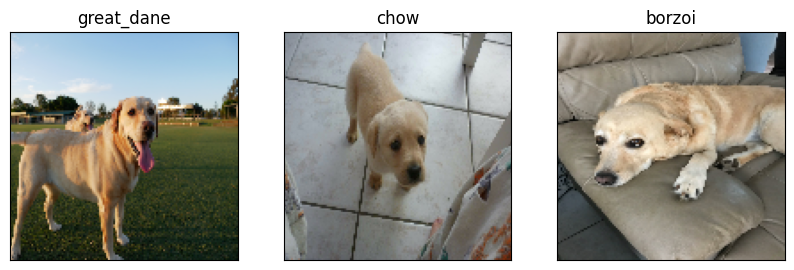

In [41]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)